# Import Libraries

In [ ]:
!pip install dython
!pip install dataprep

  Preparing metadata (setup.py) ... - done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.6/152.6 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 61.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - done
INFO: pip is looking at multiple versions of dask[array,dataframe,delayed] to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of dask[array,dataframe,delayed] to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of flask to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of dask-expr to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of dask-expr to determine which version is compatible with other requirement

In [1]:
import numpy as np
import pandas as pd
import math
import datetime
import sys

import matplotlib
import matplotlib as mpl
import matplotlib.cm as cmap
import matplotlib.colors as mpl_colors
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

import seaborn as sns
from termcolor import colored

In [ ]:
test = pd.read_csv('/content/test.csv')

id                              int64
person_age                      int64
person_income                   int64
person_home_ownership          object
person_emp_length             float64
loan_intent                    object
loan_grade                     object
loan_amnt                       int64
loan_int_rate                 float64
loan_percent_income           float64
cb_person_default_on_file      object
cb_person_cred_hist_length      int64
dtype: object


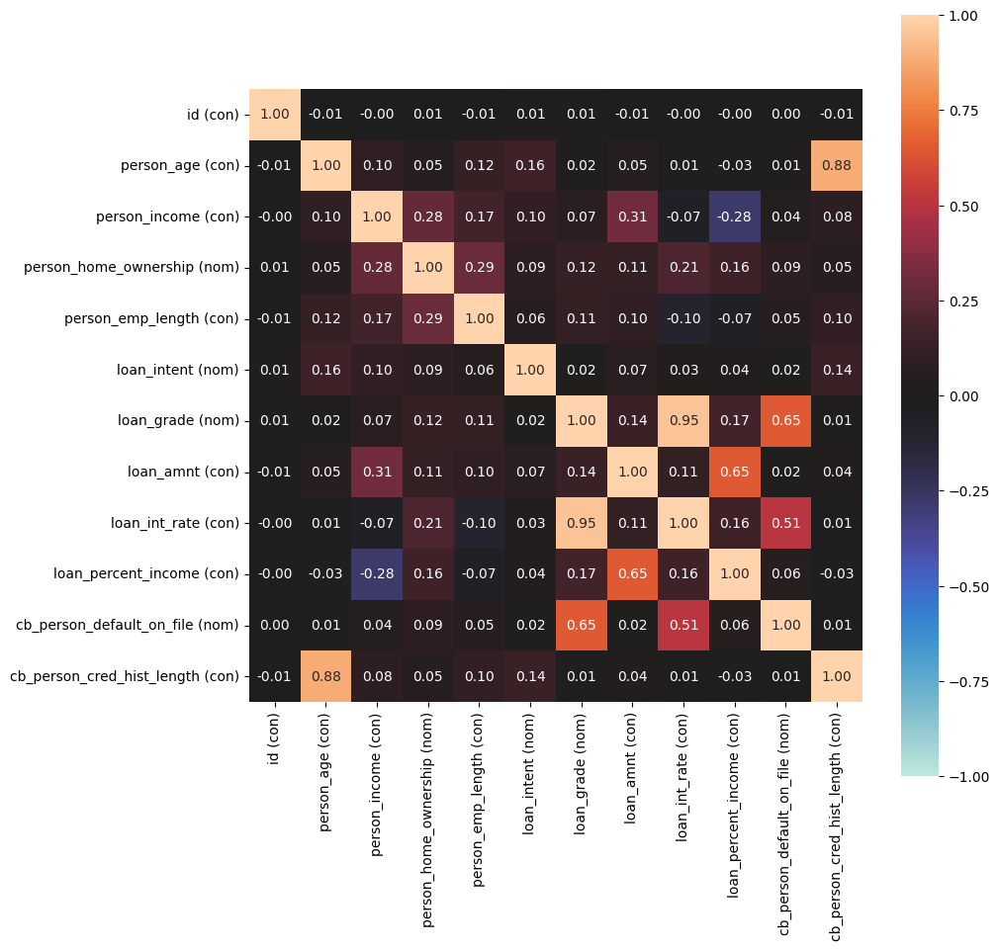

In [ ]:
from dython.nominal import associations
print(test.dtypes)
associations(test, figsize=(10, 10), mark_columns=True);

In [ ]:
from plotly.offline import init_notebook_mode, iplot, plot
from dython.nominal import associations
from dython.nominal import identify_nominal_columns
import plotly.express as px
import plotly as py
init_notebook_mode(connected=True)
import plotly.graph_objs as go

import scipy.stats as st

from warnings import simplefilter
simplefilter("ignore")

import random
import os

SEED = 2024
def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
seed_everything(SEED)

from IPython.display import clear_output
from tqdm import tqdm, trange

In [ ]:
from dataprep.eda import create_report, plot, plot_correlation, plot_missing, plot_diff

In [79]:
def hex_to_rgb(h):
    h = h.lstrip('#')
    return tuple(int(h[i:i+2], 16)/255 for i in (0, 2, 4))

palette = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252']
palette_rgb = [hex_to_rgb(x) for x in palette]
cmap = mpl_colors.ListedColormap(palette_rgb)
colors = cmap.colors
bg_color= '#fdfcf6'

black, red, green, blue = ['#000000', '#ff0000', '#00ff00', '#0000ff']

custom_params = {
    "axes.spines.right": False,
    "axes.spines.top": False,
    'grid.alpha':0.3,
    'figure.figsize': (16, 6),
    'axes.titlesize': 'Large',
    'axes.labelsize': 'Large',
    'figure.facecolor': bg_color,
    'axes.facecolor': bg_color
}

sns.set_theme(
    style='whitegrid',
    palette=sns.color_palette(palette),
    rc=custom_params
)

# Function

In [2]:
def load_datasets():
    train = pd.read_csv('./train.csv')
    test = pd.read_csv('./test.csv')
    sample_sub = pd.read_csv('./sample_submission.csv')

    return train, test, sample_sub

In [77]:
def fcn(df):
    return df.columns.tolist(), df.select_dtypes(include=['object', 'category']).columns.tolist(), df.select_dtypes(exclude=['object', 'category']).columns.tolist()

def df_info(df, name='', tab=True, plots=False, info=True, nrows=3):
    print(colored(f'\n---------- {name} ----------:\n', 'red'))

    if tab:
        display(df.head(nrows))
        display(df.tail(nrows))
        print(colored(f'{name} has {df.shape[0]} rows, {df.shape[1]} columns\n', 'blue'))

    inf = pd.DataFrame(df.dtypes).reset_index().rename(columns={'index':'column', 0:'type'})
    df_missed = pd.DataFrame(df.isnull().sum()).reset_index().rename(columns={'index':'column', 0:'missed'})
    df_unique = pd.DataFrame(df.nunique()).reset_index().rename(columns={'index':'column', 0:'unique'})
    inf['missed'] = df_missed['missed']
    inf['unique'] = df_unique['unique']
    inf['duplicate'] = df.duplicated().sum()

    desc = pd.DataFrame(df.describe(include='all').transpose())
    if 'min' in desc.columns.tolist():
        inf['min'] = desc['min'].values
        inf['max'] = desc['max'].values
        inf['avg'] = desc['mean'].values
        inf['std dev'] = desc['std'].values
    if 'top' in desc.columns.tolist():
        inf['top value'] = desc['top'].values
        inf['Freq'] = desc['freq'].values

    if info:
        display(inf.style.background_gradient(subset='missed', cmap='Reds').background_gradient(subset='unique', cmap='Greens'))

    if plots:
        print()
        if df_missed['missed'].sum() > 0:
            fig, ax = plt.subplots(1, 1, figsize=(24, 5))
            sns.barplot(df_missed[df_missed['missed'] > 0], x='column', y='missed', ax=ax)
            ax.set_title(f'{name} missed values')
            ax.bar_label(ax.containers[0])
            plt.tight_layout()
            plt.show()

        fig, ax = plt.subplots(1, 1, figsize=(24, 5))
        sns.barplot(df_unique[df_unique['unique'] > 0].drop(df_unique[df_unique['column'] == 'id'].index), x='column', y='unique', ax=ax)
        ax.set_title(f'{name} unique values')
        ax.bar_label(ax.containers[0])
        plt.tight_layout()
        plt.show()

def df_corr(df, name=''):
    associations_df = associations(df, nominal_columns='all', plot=False)
    corr_matrix = associations_df['corr']
    plt.figure(figsize=(20, 8))
    plt.gcf().set_facecolor('#FFFDD0')
    sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
    plt.title(f'{name} Correlation Matrix including Categorical Features')
    plt.show()

# Load Dataset

In [92]:
train, test, sample_sub = load_datasets()

# Data inspection

## Xem dữ liệu

In [93]:
train.head(5)

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0


In [94]:
test.head(5)

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,58645,23,69000,RENT,3.0,HOMEIMPROVEMENT,F,25000,15.76,0.36,N,2
1,58646,26,96000,MORTGAGE,6.0,PERSONAL,C,10000,12.68,0.10,Y,4
2,58647,26,30000,RENT,5.0,VENTURE,E,4000,17.19,0.13,Y,2
3,58648,33,50000,RENT,4.0,DEBTCONSOLIDATION,A,7000,8.90,0.14,N,7
4,58649,26,102000,MORTGAGE,8.0,HOMEIMPROVEMENT,D,15000,16.32,0.15,Y,4


In [95]:
train.head(5)

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0


## Tổng quan dữ liệu

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          58645 non-null  int64  
 1   person_age                  58645 non-null  int64  
 2   person_income               58645 non-null  int64  
 3   person_home_ownership       58645 non-null  object 
 4   person_emp_length           58645 non-null  float64
 5   loan_intent                 58645 non-null  object 
 6   loan_grade                  58645 non-null  object 
 7   loan_amnt                   58645 non-null  int64  
 8   loan_int_rate               58645 non-null  float64
 9   loan_percent_income         58645 non-null  float64
 10  cb_person_default_on_file   58645 non-null  object 
 11  cb_person_cred_hist_length  58645 non-null  int64  
 12  loan_status                 58645 non-null  int64  
dtypes: float64(3), int64(6), object

In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39098 entries, 0 to 39097
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          39098 non-null  int64  
 1   person_age                  39098 non-null  int64  
 2   person_income               39098 non-null  int64  
 3   person_home_ownership       39098 non-null  object 
 4   person_emp_length           39098 non-null  float64
 5   loan_intent                 39098 non-null  object 
 6   loan_grade                  39098 non-null  object 
 7   loan_amnt                   39098 non-null  int64  
 8   loan_int_rate               39098 non-null  float64
 9   loan_percent_income         39098 non-null  float64
 10  cb_person_default_on_file   39098 non-null  object 
 11  cb_person_cred_hist_length  39098 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.6+ MB


In [ ]:
sample_sub.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39098 entries, 0 to 39097
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           39098 non-null  int64  
 1   loan_status  39098 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 611.0 KB


## Kiểm tra missing values và duplicated value

In [ ]:
print("Missing values on Train:")
print(train.isnull().sum())

Missing values on Train:
id                            0
person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
loan_status                   0
dtype: int64


In [ ]:
print("Missing values on Test:")
print(test.isnull().sum())

Missing values on Test:
id                            0
person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64


=> dataset không có missing value

In [ ]:
duplicate_count = train.duplicated().sum()
print(f"Số lượng dòng trùng lặp: {duplicate_count}")

Số lượng dòng trùng lặp: 0


=> Mỗi khách hàng ứng với id có thông tin khác nhau, không trùng lặp

## Thống kê Unique value

In [ ]:
def unique_values_summary(df):
    for col in df.columns:
        unique_count = df[col].nunique()
        unique_values = df[col].unique()
        print(f"Column: {col}")
        print(f"  Number of unique values: {unique_count}")
        print(f"  Unique values: {unique_values}\n")

unique_values_summary(train)

Column: id
  Number of unique values: 58645
  Unique values: [    0     1     2 ... 58642 58643 58644]

Column: person_age
  Number of unique values: 53
  Unique values: [ 37  22  29  30  27  25  21  35  31  26  28  32  23  24  33  44  38  43
  46  48  36  41  34  40  47  42  51  50  39  56  60  49  58  54  45  59
  65  53  55  57  52  62  64  84  70  66  73  69  61  20  80  76 123]

Column: person_income
  Number of unique values: 2641
  Unique values: [ 35000  56000  28800 ...  44955  90730 124600]

Column: person_home_ownership
  Number of unique values: 4
  Unique values: ['RENT' 'OWN' 'MORTGAGE' 'OTHER']

Column: person_emp_length
  Number of unique values: 36
  Unique values: [  0.   6.   8.  14.   2.   9.  11.   5.   1.  13.   3.  10.  12.   4.
   7.  21.  17.  16.  18.  19.  15.  20.  23.  24.  26.  22.  25.  41.
  27.  28.  35.  29.  30.  31. 123.  39.]

Column: loan_intent
  Number of unique values: 6
  Unique values: ['EDUCATION' 'MEDICAL' 'PERSONAL' 'VENTURE' 'DEBTCONSOLIDA

# Exploratory Data Analysis

## Thống kê numeric features và category features

In [97]:
TARGET = 'loan_status'
features = train.drop([TARGET, 'id'], axis=1)
number_of_features = features.shape[1]
numeric_features = features.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = features.select_dtypes(include=['object', 'category']).columns.tolist()
print(f"TARGET: {TARGET}")
print(f"The number of feature: {number_of_features}")
print('='*30)
print(f"The number of Numerical features: {len(numeric_features)}")
print(f"Numerical features: {numeric_features}")
print('='*30)
print(f"The number of Categorical features: {len(categorical_features)}")
print(f"Categorical features: {categorical_features}")

TARGET: loan_status
The number of feature: 11
The number of Numerical features: 7
Numerical features: ['person_age', 'person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length']
The number of Categorical features: 4
Categorical features: ['person_home_ownership', 'loan_intent', 'loan_grade', 'cb_person_default_on_file']


In [96]:
train.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_status
count,58645.000000,58645.000000,5.864500e+04,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000
mean,29322.000000,27.550857,6.404617e+04,4.701015,9217.556518,10.677874,0.159238,5.813556,0.142382
std,16929.497605,6.033216,3.793111e+04,3.959784,5563.807384,3.034697,0.091692,4.029196,0.349445
min,0.000000,20.000000,4.200000e+03,0.000000,500.000000,5.420000,0.000000,2.000000,0.000000
25%,14661.000000,23.000000,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,3.000000,0.000000
50%,29322.000000,26.000000,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,4.000000,0.000000
75%,43983.000000,30.000000,7.560000e+04,7.000000,12000.000000,12.990000,0.210000,8.000000,0.000000
max,58644.000000,123.000000,1.900000e+06,123.000000,35000.000000,23.220000,0.830000,30.000000,1.000000


In [98]:
print("Thống kê cơ bản cho các cột numeric:")
train[numeric_features].describe()

Thống kê cơ bản cho các cột numeric:


,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length
count,58645.000000,5.864500e+04,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000
mean,27.550857,6.404617e+04,4.701015,9217.556518,10.677874,0.159238,5.813556
std,6.033216,3.793111e+04,3.959784,5563.807384,3.034697,0.091692,4.029196
min,20.000000,4.200000e+03,0.000000,500.000000,5.420000,0.000000,2.000000
25%,23.000000,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,3.000000
50%,26.000000,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,4.000000
75%,30.000000,7.560000e+04,7.000000,12000.000000,12.990000,0.210000,8.000000
max,123.000000,1.900000e+06,123.000000,35000.000000,23.220000,0.830000,30.000000


In [ ]:
print("Thống kê tần suất cho các cột categorical:")
for col in categorical_features:
    print(f"\n{col}:\n{features[col].value_counts()}")

Thống kê tần suất cho các cột categorical:

person_home_ownership:
RENT        30594
MORTGAGE    24824
OWN          3138
OTHER          89
Name: person_home_ownership, dtype: int64

loan_intent:
EDUCATION            12271
MEDICAL              10934
PERSONAL             10016
VENTURE              10011
DEBTCONSOLIDATION     9133
HOMEIMPROVEMENT       6280
Name: loan_intent, dtype: int64

loan_grade:
A    20984
B    20400
C    11036
D     5034
E     1009
F      149
G       33
Name: loan_grade, dtype: int64

cb_person_default_on_file:
N    49943
Y     8702
Name: cb_person_default_on_file, dtype: int64


## Phân phối của target (loan_status)

In [ ]:
print("Phân phối của target:")
print(train[TARGET].value_counts())

Phân phối của target:
0    50295
1     8350
Name: loan_status, dtype: int64


In [ ]:
class_percentage = train[TARGET].value_counts(normalize=True)
print("Class distribution:")
print(class_percentage)

Class distribution:
0    0.857618
1    0.142382
Name: loan_status, dtype: float64


In [ ]:
imbalance_ratio = class_percentage.max() / class_percentage.min()
print(f"Imbalance Ratio: {imbalance_ratio:.2f}")

Imbalance Ratio: 6.02


In [ ]:
from scipy.stats import entropy
ent = entropy(class_percentage)
print(f"Entropy: {ent:.4f}")

Entropy: 0.4093


In [ ]:
def chi_square_test(observed, expected):
    chi2 = sum(((o - e) ** 2) / e for o, e in zip(observed, expected))
    import math
    p_value = math.exp(-0.5 * chi2) * (1 + (0.5 * chi2))

    return chi2, p_value

total_samples = len(train)
observed_proportions = class_percentage # [ 0.857618, 0.142382]
uniform_dist = np.ones_like(class_percentage) / len(class_percentage)
expected_proportions = uniform_dist # [0.5, 0.5]

observed_counts = [p * total_samples for p in observed_proportions]
expected_counts = [p * total_samples for p in expected_proportions]

chi2_statistic, p_value = chi_square_test(observed_counts, expected_counts)

print(f"Chi-square statistic: {chi2_statistic:.4f}")
print(f"P-value: {p_value:}")

Chi-square statistic: 30000.5631
P-value: 0.0


In [ ]:
from scipy.stats import chisquare
observed = train[TARGET].value_counts()
expected = [len(train) / len(observed)] * len(observed)
chi2, p_value = chisquare(f_obs=observed, f_exp=expected)
print(f"Chi-square statistic: {chi2:.4f}, p-value: {p_value:.4f}")

Chi-square statistic: 30000.5631, p-value: 0.0000


IR = 6.02 > 5

Entropy: 0.4093 -> 0

p-value<0.05

=> Phân phối nhãn mất cân bằng nghiêm trọng

# Visulization

## Độ tương quan numeric feature train và test

In [74]:
def kde_nums(train, test):
    _, _, nums = fcn(test)
    columns = nums
    n_cols = 3
    n_rows = math.ceil(len(columns)/n_cols)
    fig, ax = plt.subplots(n_rows, n_cols, figsize=(16, n_rows*5))
    ax = ax.flatten()

    for i, column in enumerate(columns):
        plot_axes = [ax[i]]

        sns.kdeplot(train[column], label='Train', ax=ax[i], color=red)

        sns.kdeplot(test[column], label='Test', ax=ax[i], color=blue)

        # titles
        ax[i].set_title(f'{column} Distribution');
        ax[i].set_xlabel(None)

        # remove axes to show only one at the end
        plot_axes = [ax[i]]
        handles = []
        labels = []
        for plot_ax in plot_axes:
            handles += plot_ax.get_legend_handles_labels()[0]
            labels += plot_ax.get_legend_handles_labels()[1]
            plot_ax.legend().remove()

    for i in range(i+1, len(ax)):
        ax[i].axis('off')

    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.04), fontsize=14, ncol=3)
    plt.tight_layout()

Numerical features:


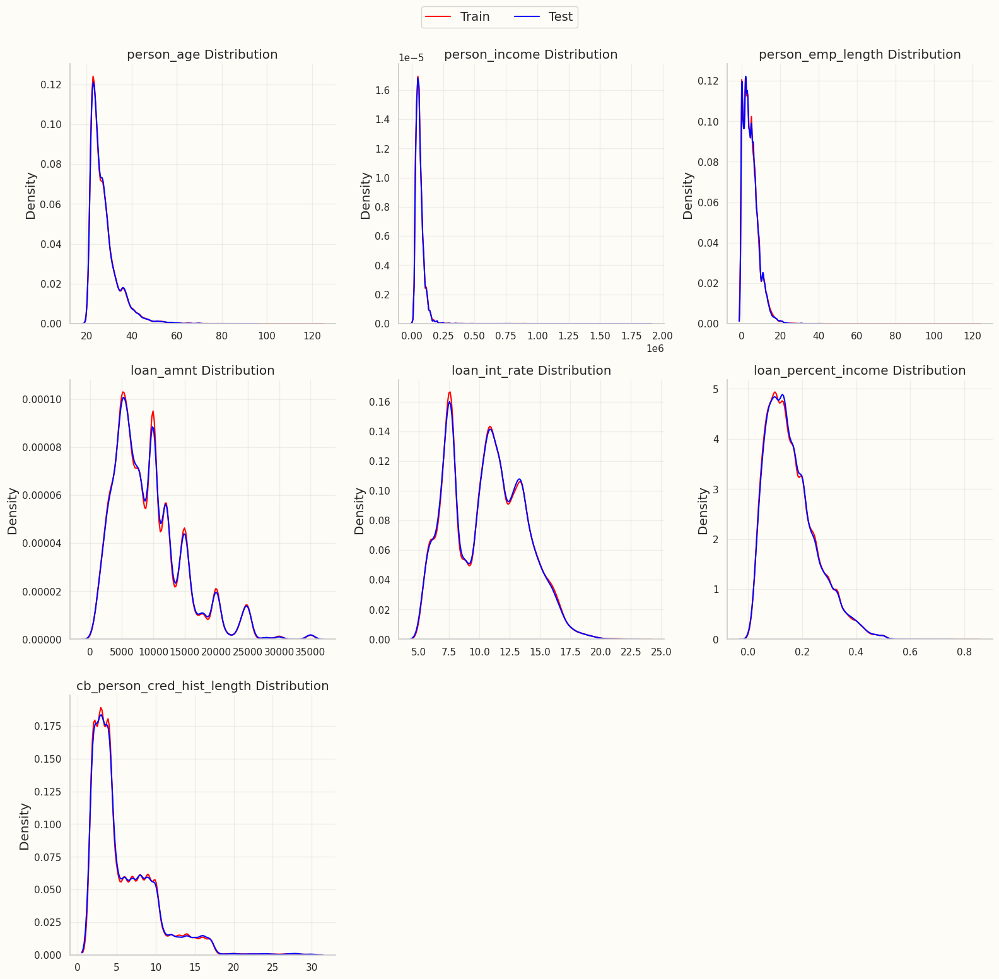

In [81]:
print('Numerical features:')
train_not_id = train.drop(['id'], axis=1)
test_not_id = test.drop(['id'], axis=1)
kde_nums(train_not_id, test_not_id)

## Thống kê Unique value

<ipython-input-85-4051ce2d232e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=unique_counts.index, y=unique_counts.values, palette="coolwarm")


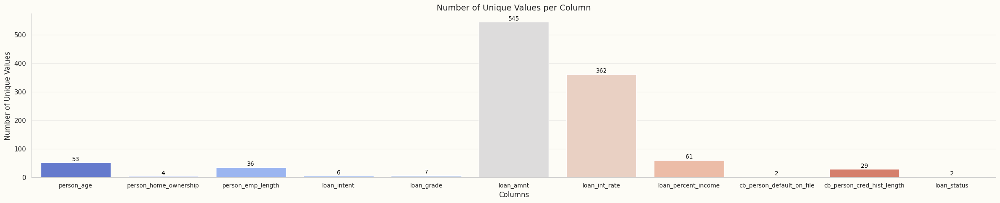

In [85]:
def plot_unique_counts_with_labels(df, exclude_columns=None, title="Number of Unique Values per Column"):
    if exclude_columns:
        df = df.drop(columns=exclude_columns)

    unique_counts = df.nunique()

    plt.figure(figsize=(24, 5))
    ax = sns.barplot(x=unique_counts.index, y=unique_counts.values, palette="coolwarm")

    for i, count in enumerate(unique_counts.values):
        ax.text(i, count + 0.5, f'{count}', ha='center', va='bottom', fontsize=10, color='black')

    plt.xticks(rotation=0, ha='center', fontsize=10)  # Tên cột giữ ngang
    plt.title(title, fontsize=14)
    plt.xlabel("Columns", fontsize=12)
    plt.ylabel("Number of Unique Values", fontsize=12)
    plt.tight_layout()
    plt.show()

plot_unique_counts_with_labels(train, exclude_columns=['id', 'person_income', 'anomaly_score', 'is_anomaly'])

<ipython-input-85-4051ce2d232e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=unique_counts.index, y=unique_counts.values, palette="coolwarm")


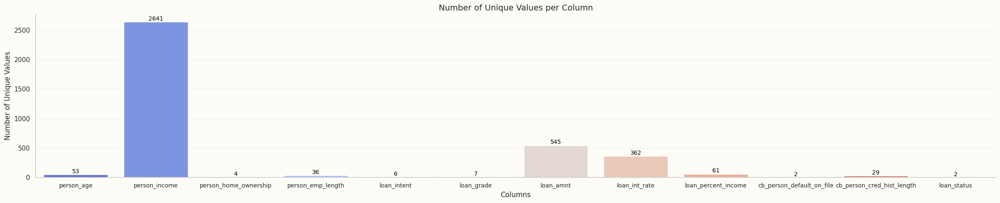

In [86]:
plot_unique_counts_with_labels(train, exclude_columns=['id', 'anomaly_score', 'is_anomaly'])

## Phân phối của target (loan_status)

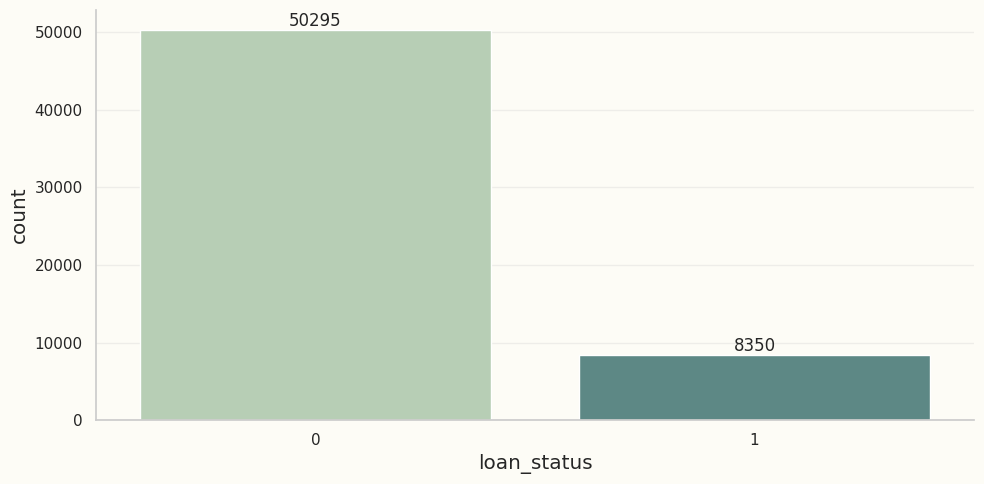

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
sns.countplot(train, x=TARGET)
ax.bar_label(ax.containers[0])
plt.tight_layout()
plt.show()

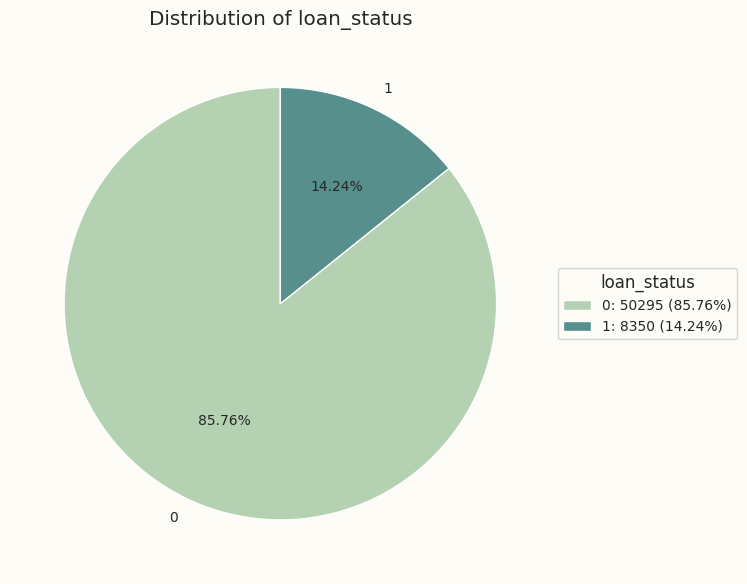

In [ ]:
target_counts = train[TARGET].value_counts()
labels = target_counts.index
sizes = target_counts.values
percentages = [f"{(size / sum(sizes)) * 100:.2f}%" for size in sizes]

fig, ax = plt.subplots(figsize=(8, 6))
wedges, texts, autotexts = ax.pie(
    sizes, labels=labels, autopct=lambda p: f'{p:.2f}%', startangle=90, textprops={'fontsize': 10}
)

plt.title(f"Distribution of {TARGET}")
ax.legend(wedges, [f"{label}: {size} ({percent})" for label, size, percent in zip(labels, sizes, percentages)],
          title=TARGET, loc="center left", bbox_to_anchor=(1, 0, 0.5, 1), fontsize=10)
plt.tight_layout()
plt.show()


## Phân phối các cột numeric

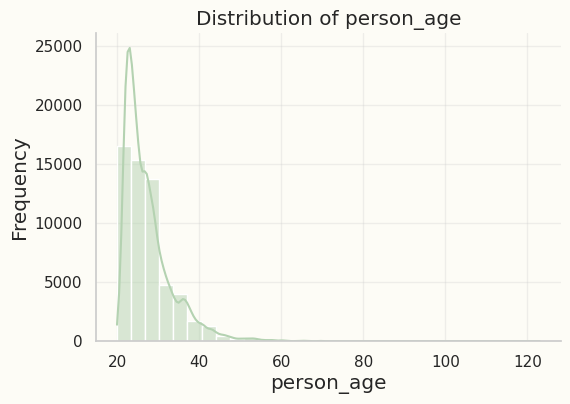

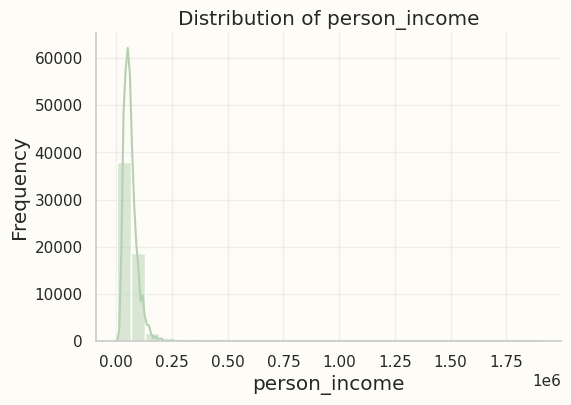

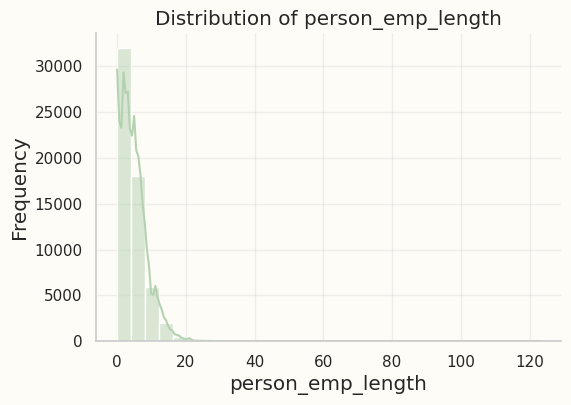

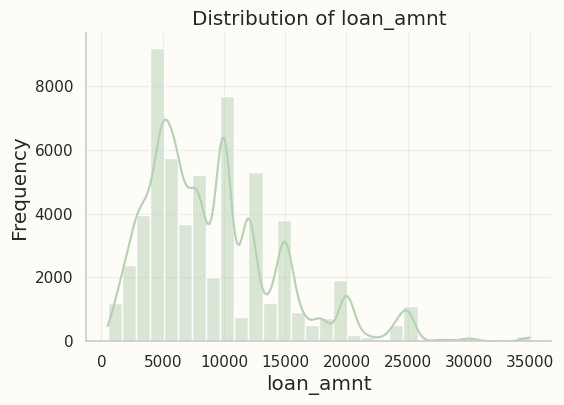

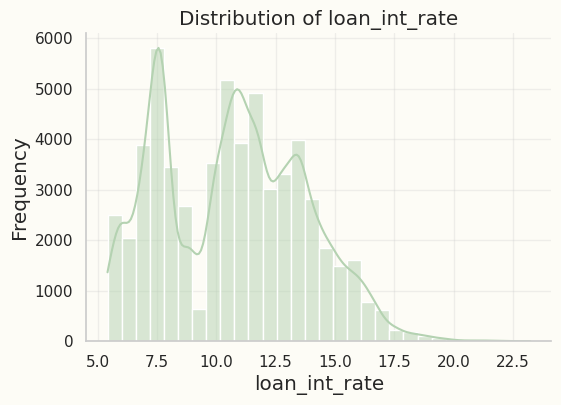

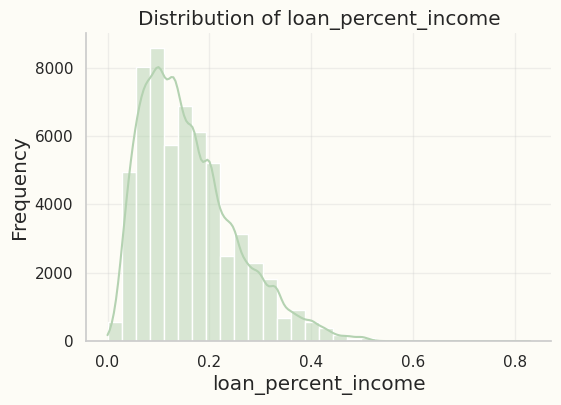

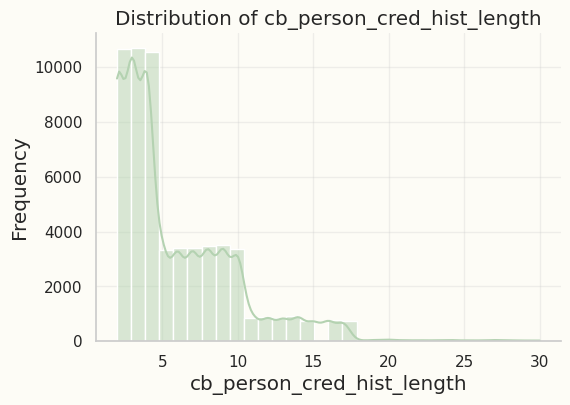

In [ ]:
for col in numeric_features:
    plt.figure(figsize=(6, 4))
    sns.histplot(train[col], kde=True, bins=30)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

## Tần suất các cột categorical

Categorical features top most frequent values:


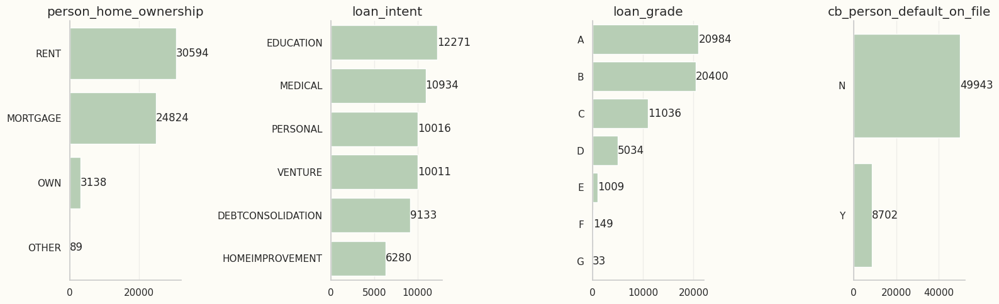

In [99]:
def count_cats(train, test, n_cols=3, tight=True):
    _, columns, _ = fcn(test)
    if len(columns) == 0:
        return
    n_cols = 4
    n_rows = math.ceil(len(columns)/n_cols)
    fig, ax = plt.subplots(n_rows, n_cols, figsize=(16, n_rows*5))
    ax = ax.flatten()

    for i, column in enumerate(columns):
        vc = train[column].value_counts().reset_index()
        vc.columns = [column, 'count']
        sns.barplot(data=vc, y=column, x='count', ax=ax[i])

        # titles
        ax[i].set_title(f'{column}')
        ax[i].set_xlabel('')
        ax[i].set_ylabel('')
        ax[i].bar_label(ax[i].containers[0])

    if tight:
        plt.tight_layout()

print('Categorical features top most frequent values:')
count_cats(train, test)

## Phân phối loan_status theo các cột categorical

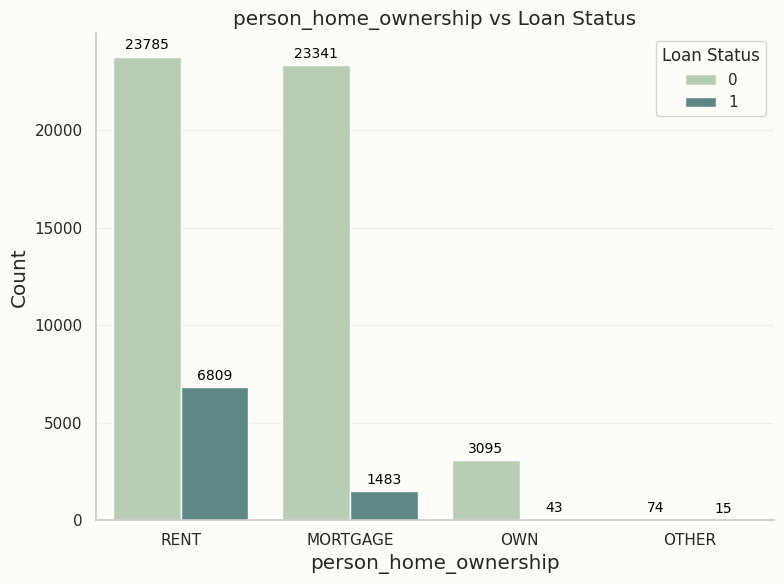

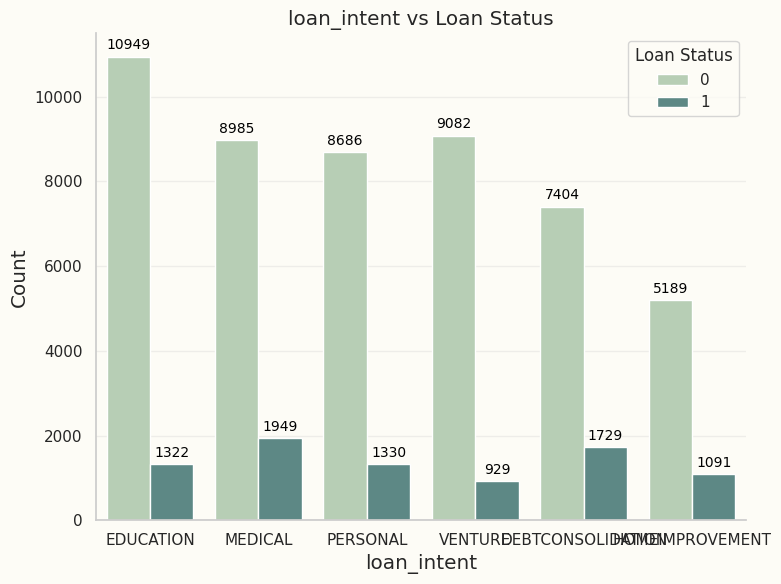

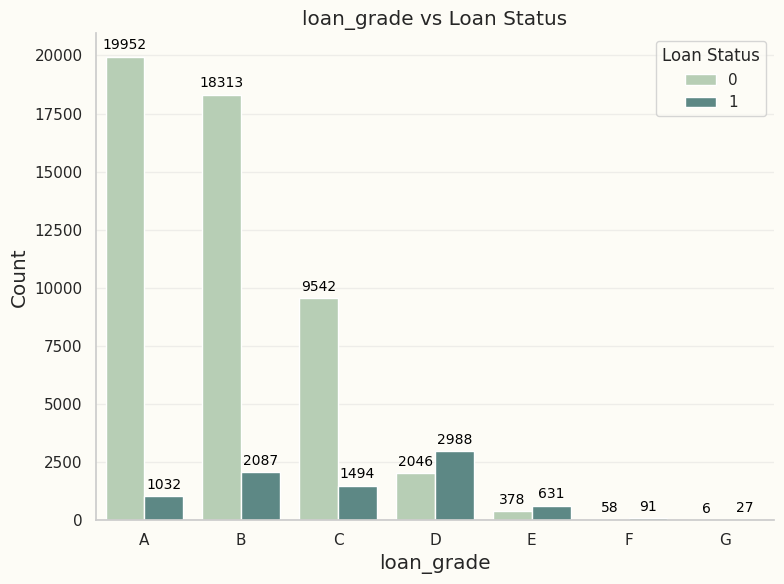

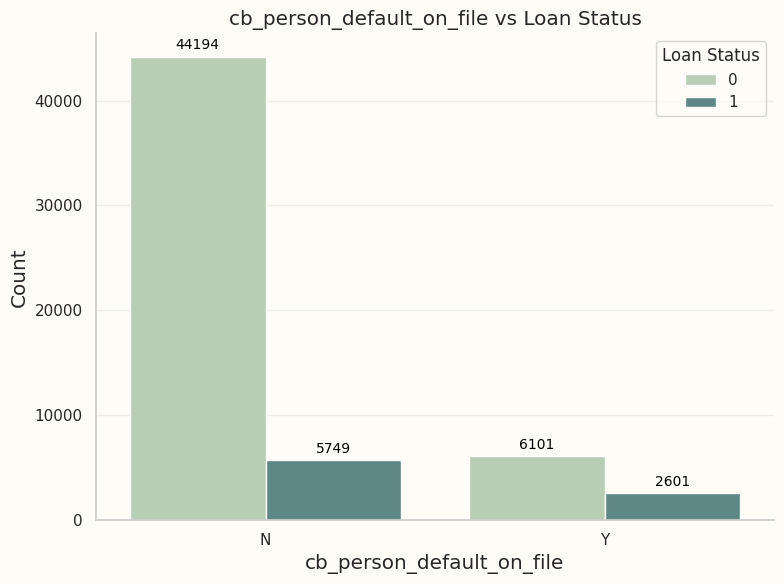

In [ ]:
for col in categorical_features:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(data=train, x=col, hue='loan_status', order=train[col].value_counts().index)
    plt.title(f"{col} vs Loan Status")
    plt.xlabel(col)
    plt.ylabel("Count")

    # Ghi số lượng lên đầu mỗi cột
    for container in ax.containers:
        ax.bar_label(container, label_type='edge', fontsize=10, color='black', padding=3)

    # Đặt tên cột nằm ngang
    plt.xticks(rotation=0)
    plt.legend(title="Loan Status")
    plt.tight_layout()
    plt.show()


In [ ]:
train_not_id = train.drop(['id'], axis=1)

<Axes: xlabel='loan_status', ylabel='cb_person_default_on_file'>

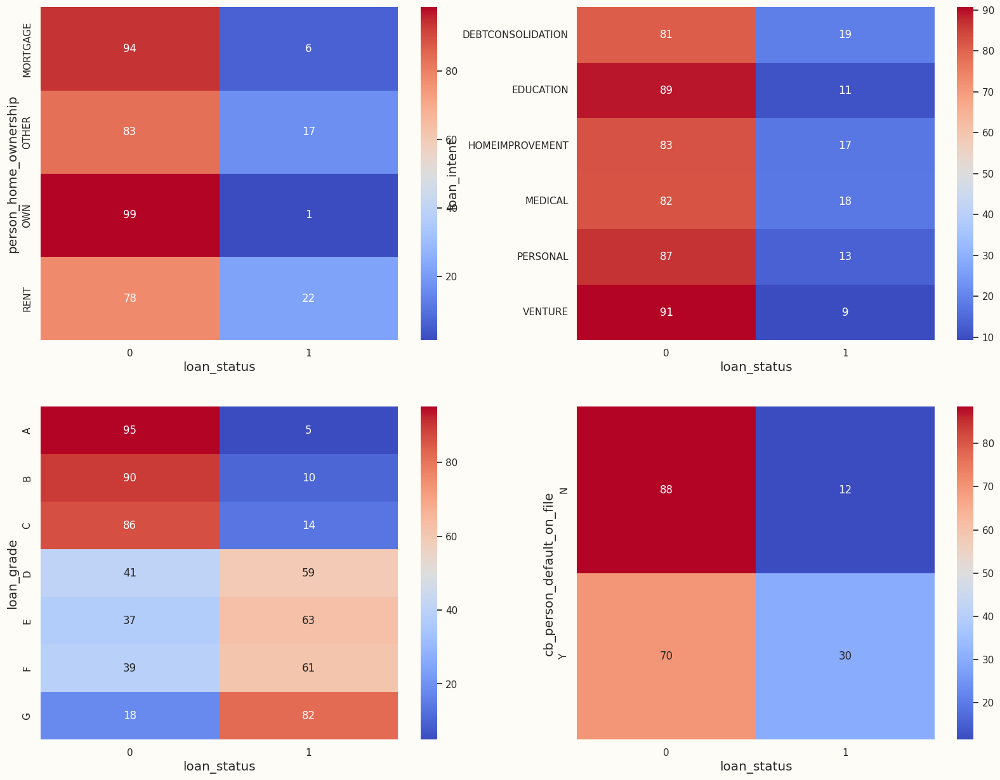

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(20, 15))

cmap = sns.color_palette("coolwarm", as_cmap=True)

sns.heatmap(data=round(100*pd.crosstab(train_not_id['person_home_ownership'], train_not_id['loan_status'], normalize=0), 2), annot=True, cmap=cmap, fmt='.0f', ax=axes[0, 0])
sns.heatmap(data=round(100*pd.crosstab(train_not_id['loan_intent'], train_not_id['loan_status'], normalize=0), 2), annot=True, cmap=cmap, fmt='.0f', ax=axes[0, 1])
sns.heatmap(data=round(100*pd.crosstab(train_not_id['loan_grade'], train_not_id['loan_status'], normalize=0), 2), annot=True, cmap=cmap, fmt='.0f', ax=axes[1, 0])
sns.heatmap(data=round(100*pd.crosstab(train_not_id['cb_person_default_on_file'], train_not_id['loan_status'], normalize=0), 2), annot=True, cmap=cmap, fmt='.0f', ax=axes[1, 1])

These are a couple of observations from the above charts:

- When loan_grade is equal to D, E, F, and G have the higher proportions of loan_status=1
- cb_person_default_on_file=Y have a higher proportion loan_status=1 when compared to cb_person_default_on_file=N

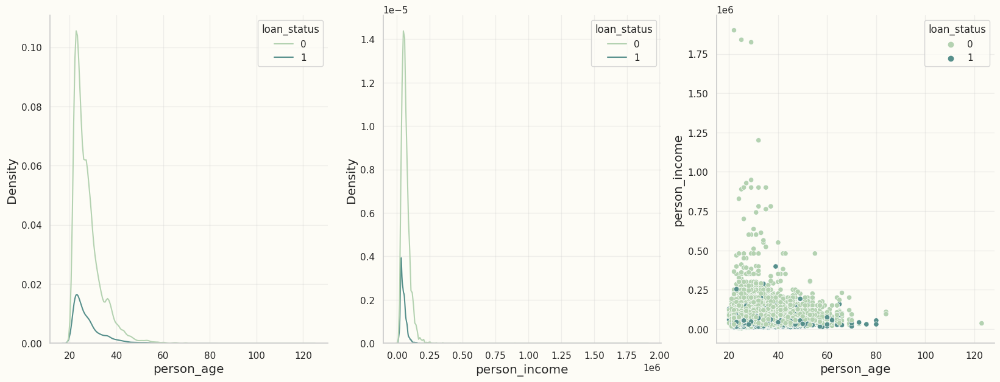

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

sns.kdeplot(data=train_not_id, x='person_age', hue='loan_status', ax=axes[0]);
sns.kdeplot(data=train_not_id, x='person_income', hue='loan_status', ax=axes[1]);
sns.scatterplot(data=train_not_id, x='person_age', y='person_income', hue='loan_status', ax=axes[2]);

From the above charts, these are a couple of observations:

- loan_status=0 and loan_status=1 have similar distributions for person_age and person_income.
- There is one person with person_age=123.

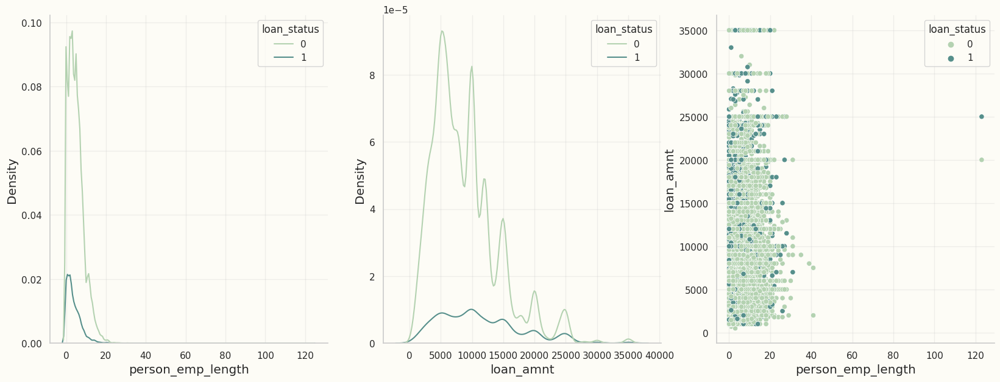

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

sns.kdeplot(data=train_not_id, x='person_emp_length', hue='loan_status', ax=axes[0]);
sns.kdeplot(data=train_not_id, x='loan_amnt', hue='loan_status', ax=axes[1]);
sns.scatterplot(data=train_not_id, x='person_emp_length', y='loan_amnt', hue='loan_status', ax=axes[2]);

From the above charts, these are a couple of observations:

- loan_status=0 and loan_status=1 have similar distributions for person_emp_length and loan_amnt.
- There are two persons with person_emp_length=123.

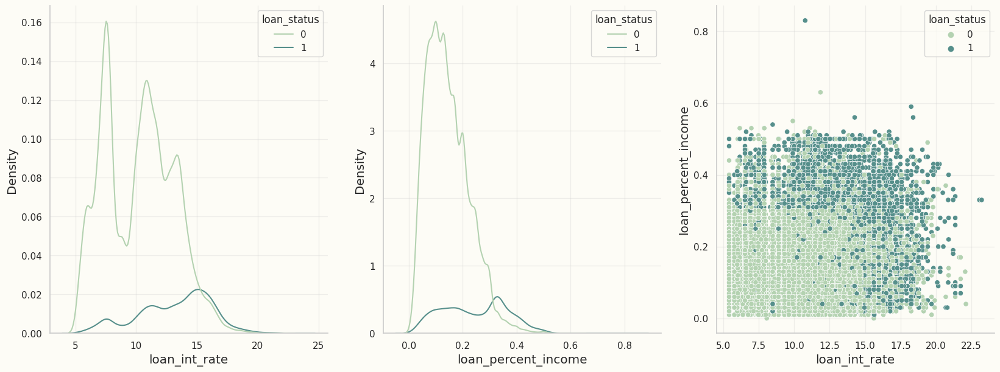

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

sns.kdeplot(data=train_not_id, x='loan_int_rate', hue='loan_status', ax=axes[0]);
sns.kdeplot(data=train_not_id, x='loan_percent_income', hue='loan_status', ax=axes[1]);
sns.scatterplot(data=train_not_id, x='loan_int_rate', y='loan_percent_income', hue='loan_status', ax=axes[2]);

From the above charts, these are a couple of observations:

- loan_status=0 and loan_status=1 have similar distributions for loan_int_rate and loan_percent_income.
- There are two loans with loan_int_rate>23.
- There are two loans with loan_percent_income>0.6.

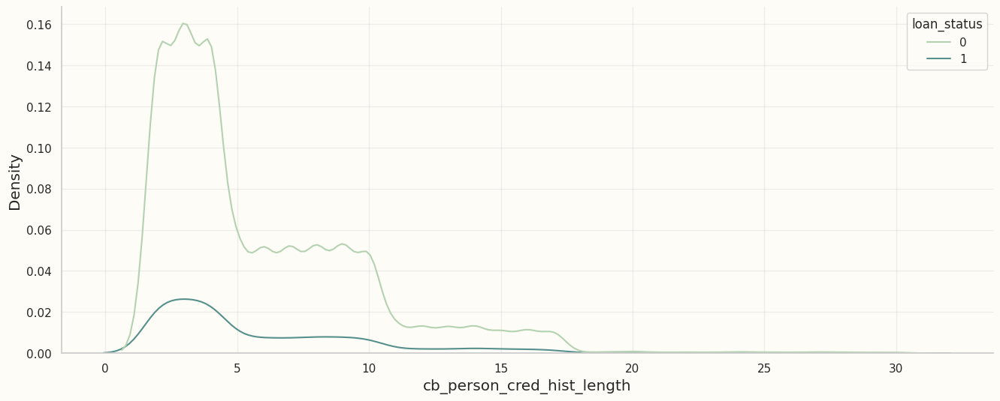

In [ ]:
sns.kdeplot(data=train_not_id, x='cb_person_cred_hist_length', hue='loan_status');

From the above chart, we see that the distribution of cb_person_cred_hist_length is similar whether loan_statu is 0 or 1.

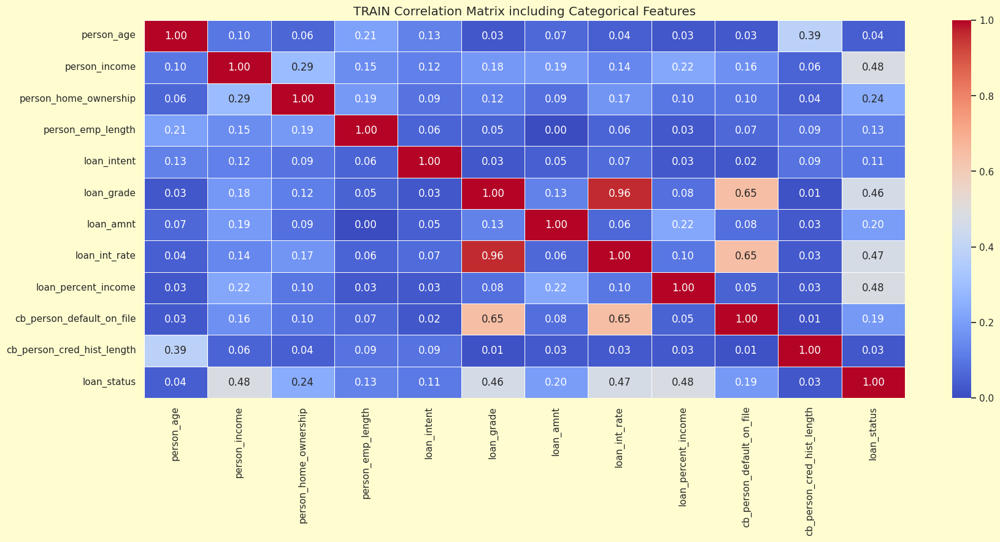

In [ ]:
df_corr(train_not_id, name='TRAIN')

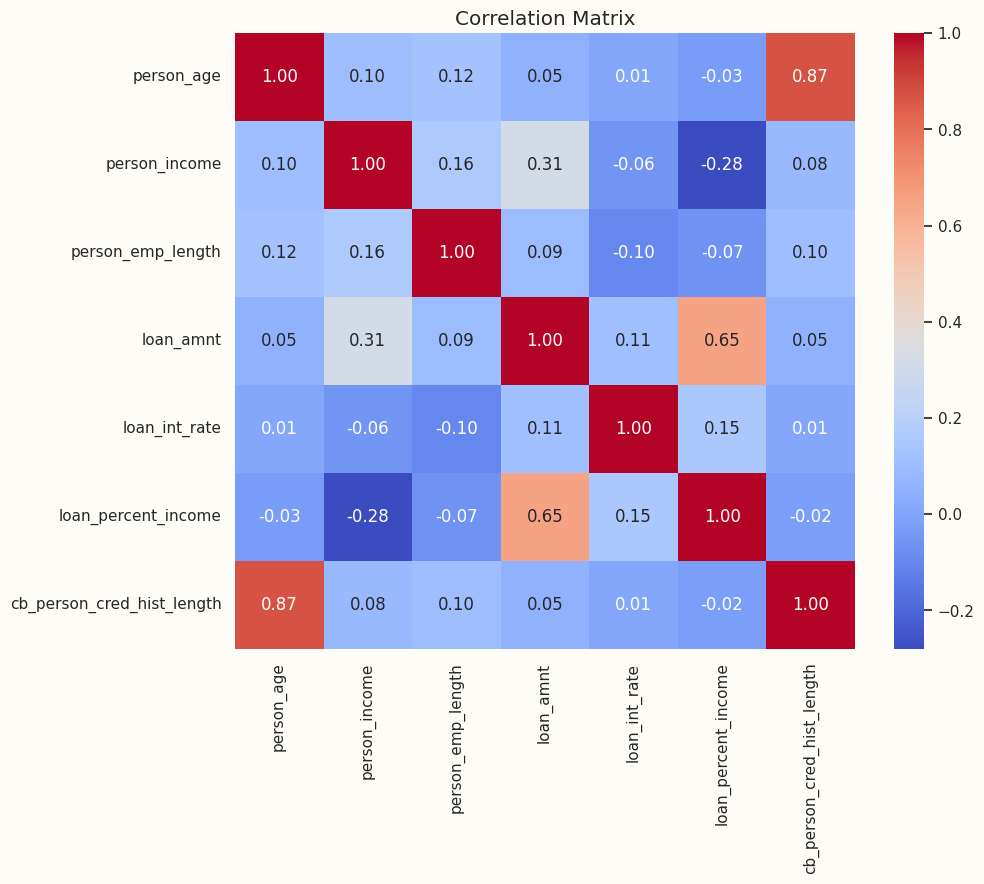

In [ ]:
# d. Heatmap tương quan giữa các cột numeric
plt.figure(figsize=(10, 8))
correlation_matrix = train[numeric_features].corr()
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

In [6]:
import pandas as pd
from sklearn.ensemble import IsolationForest

In [7]:
# Đọc dữ liệu từ file CSV
# file_path = 'train.csv'  # Đường dẫn tới file dữ liệu
# data = pd.read_csv(file_path)

# Chỉ chọn các cột số để áp dụng Isolation Forest
numerical_cols = train.select_dtypes(include=['float64', 'int64']).drop(columns=['id']).columns
numerical_data = train[numerical_cols]

# Áp dụng Isolation Forest
isolation_forest = IsolationForest(contamination=0.05, random_state=42)
train['anomaly_score'] = isolation_forest.fit_predict(numerical_data)

# Phân loại điểm bất thường
train['is_anomaly'] = train['anomaly_score'].apply(lambda x: 'Anomaly' if x == -1 else 'Normal')

# Thống kê kết quả
anomalies_summary = train['is_anomaly'].value_counts()
print("Phân phối bất thường:\n", anomalies_summary)

# Lọc các điểm bất thường
anomalies = train[train['is_anomaly'] == 'Anomaly']
print("\nMột số điểm bất thường:\n", anomalies.head())

# Lưu kết quả ra file (tuỳ chọn)
# data.to_csv('data_with_anomalies.csv', index=False)


Phân phối bất thường:
 is_anomaly
Normal     55712
Anomaly     2933
Name: count, dtype: int64

Một số điểm bất thường:
       id  person_age  person_income person_home_ownership  person_emp_length  \
81    81          30          45600                  RENT                6.0   
86    86          48         112000              MORTGAGE               21.0   
91    91          24         225000                  RENT                0.0   
131  131          36         110000              MORTGAGE                8.0   
132  132          32         150000                  RENT               16.0   

           loan_intent loan_grade  loan_amnt  loan_int_rate  \
81   DEBTCONSOLIDATION          A      23500           7.66   
86             MEDICAL          A       5000           7.90   
91             MEDICAL          C       3000          14.26   
131    HOMEIMPROVEMENT          A      28000           7.49   
132    HOMEIMPROVEMENT          A      25000           7.88   

     loan_percent_in

In [28]:
train.shape # train hiện tại bao gồm Annomaly

(58645, 15)

In [29]:
train_normal = train[train['is_anomaly'] == 'Normal']
train_normal

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status,anomaly_score,is_anomaly
0,0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0,1,Normal
1,1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0,1,Normal
2,2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0,1,Normal
3,3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0,1,Normal
4,4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0,1,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,58640,34,120000,MORTGAGE,5.0,EDUCATION,D,25000,15.95,0.21,Y,10,0,1,Normal
58641,58641,28,28800,RENT,0.0,MEDICAL,C,10000,12.73,0.35,N,8,1,1,Normal
58642,58642,23,44000,RENT,7.0,EDUCATION,D,6800,16.00,0.15,N,2,1,1,Normal
58643,58643,22,30000,RENT,2.0,EDUCATION,A,5000,8.90,0.17,N,3,0,1,Normal


In [30]:
df_train = train.drop(columns=['id'])
df_train_normal = train_normal.drop(columns=['id'])
df_test = test.drop(columns=['id'])

In [31]:
df_train = train.drop(columns=['id', 'anomaly_score', 'is_anomaly'])
df_train_normal = train_normal.drop(columns=['id', 'anomaly_score', 'is_anomaly'])

In [32]:
df_train.shape, df_train_normal.shape ,df_test.shape

((58645, 12), (55712, 12), (39098, 11))

In [33]:
from sklearn.preprocessing import LabelEncoder

def preprocess_data(df_train, df_train_normal, df_test):
    label_enc = LabelEncoder()
    label_cols = ['person_home_ownership', 'loan_grade', 'cb_person_default_on_file']
    for col in label_cols:
        df_train[col] = label_enc.fit_transform(df_train[col])
        df_train_normal[col] = label_enc.transform(df_train_normal[col])
        df_test[col] = label_enc.transform(df_test[col])
    df_train = pd.get_dummies(df_train, columns=['loan_intent'], drop_first=True)
    df_train_normal = pd.get_dummies(df_train_normal, columns=['loan_intent'], drop_first=True)
    df_test = pd.get_dummies(df_test, columns=['loan_intent'], drop_first=True)
    target_col = 'loan_status'
    train_columns = df_train.drop(columns=[target_col]).columns
    train_normal_columns = df_train_normal.drop(columns=[target_col]).columns
    df_test = df_test.reindex(columns=train_columns, fill_value=0)
    return df_train, df_test, df_train_normal

df_train_processed, df_test_processed, df_train_normal = preprocess_data(df_train, df_train_normal, df_test)

In [34]:
df_train = df_train_processed
df_train_normal = df_train_normal
df_test = df_test_processed

In [35]:
df_train.shape,df_test.shape, df_train_normal.shape

((58645, 16), (39098, 15), (55712, 16))

In [36]:
df_train.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_grade', 'loan_amnt', 'loan_int_rate',
       'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'loan_status', 'loan_intent_EDUCATION',
       'loan_intent_HOMEIMPROVEMENT', 'loan_intent_MEDICAL',
       'loan_intent_PERSONAL', 'loan_intent_VENTURE'],
      dtype='object')

In [37]:
y = df_train['loan_status']
df_train_drop = df_train.drop(['loan_status'],axis=1)
X = df_train_drop

In [38]:
y_normal = df_train_normal['loan_status']
df_train_normal = df_train_normal.drop(['loan_status'],axis=1)
X_normal = df_train_normal

In [40]:
X.shape,y.shape, X_normal.shape, y_normal.shape

((58645, 15), (58645,), (55712, 15), (55712,))

In [41]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_train_data = train
scaled_train_normal_data = train_normal
scaled_test_data = test

In [44]:
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold


In [47]:
df_train

,person_age,person_income,person_home_ownership,person_emp_length,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE
0,37,35000,3,0.0,1,6000,11.49,0.17,0,14,0,True,False,False,False,False
1,22,56000,2,6.0,2,4000,13.35,0.07,0,2,0,False,False,True,False,False
2,29,28800,2,8.0,0,6000,8.90,0.21,0,10,0,False,False,False,True,False
3,30,70000,3,14.0,1,12000,11.11,0.17,0,5,0,False,False,False,False,True
4,22,60000,3,2.0,0,6000,6.92,0.10,0,3,0,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,34,120000,0,5.0,3,25000,15.95,0.21,1,10,0,True,False,False,False,False
58641,28,28800,3,0.0,2,10000,12.73,0.35,0,8,1,False,False,True,False,False
58642,23,44000,3,7.0,3,6800,16.00,0.15,0,2,1,True,False,False,False,False
58643,22,30000,3,2.0,0,5000,8.90,0.17,0,3,0,True,False,False,False,False


In [51]:
lgb_params = {
    'objective': 'binary',
    'n_estimators': 3000,
    'metric': 'binary_logloss',
    'boosting_type': 'gbdt',
    'random_state': 42,
    'learning_rate': 0.0322942967545754,
    'num_leaves': 24,
    'max_depth': 15,
    'min_data_in_leaf': 25,
    'feature_fraction': 0.6236144085285287,
    'bagging_fraction': 0.9596685778433888,
    'bagging_freq': 3,
    'verbose': -1,
    'early_stopping_rounds':10
}

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
lgbm_predictions = np.zeros(len(X))
lgbm_true_labels = np.zeros(len(X))
lgbm_test_predictions = np.zeros(len(scaled_test_data))

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
  X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
  y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
  #lgbm_model = LGBMClassifier(**lgb_params)
  lgbm_model = LGBMClassifier(random_state=42)
  lgbm_model.fit(X_train, y_train,
    eval_set=[(X_val, y_val)],
    eval_metric='auc')

  lgbm_fold_preds = lgbm_model.predict_proba(X_val)[:, 1]
  lgbm_fold_test_preds = lgbm_model.predict_proba(df_test)[:, 1]
  lgbm_predictions[val_idx] = lgbm_fold_preds
  lgbm_true_labels[val_idx] = y_val
  lgbm_test_predictions += lgbm_fold_test_preds / n_splits
overall_metric_lgbm = roc_auc_score(lgbm_true_labels, lgbm_predictions)
print("Overall AUC (LGBMClassifier with StratifiedKFold):", overall_metric_lgbm)

[LightGBM] [Info] Number of positive: 6680, number of negative: 40236
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 841
[LightGBM] [Info] Number of data points in the train set: 46916, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.142382 -> initscore=-1.795644
[LightGBM] [Info] Start training from score -1.795644
[LightGBM] [Info] Number of positive: 6680, number of negative: 40236
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 844
[LightGBM] [Info] Number of data points in the train set: 46916, number of used features: 15
[LightGBM] [Info] [bin

In [62]:
lgb_params = {
    'objective': 'binary',
    'n_estimators': 3000,
    'metric': 'binary_logloss',
    'boosting_type': 'gbdt',
    'random_state': 42,
    'learning_rate': 0.0322942967545754,
    'num_leaves': 24,
    'max_depth': 15,
    'min_data_in_leaf': 25,
    'feature_fraction': 0.6236144085285287,
    'bagging_fraction': 0.9596685778433888,
    'bagging_freq': 3,
    'verbose': -1,
    'early_stopping_rounds':10
}
X_normal
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
lgbm_predictions = np.zeros(len(X_normal))
lgbm_true_labels = np.zeros(len(X_normal))
lgbm_test_predictions = np.zeros(len(scaled_test_data))

for fold, (train_idx, val_idx) in enumerate(skf.split(X_normal, y_normal)):
  X_train, X_val = X_normal.iloc[train_idx], X_normal.iloc[val_idx]
  y_train, y_val = y_normal.iloc[train_idx], y_normal.iloc[val_idx]
  #lgbm_model = LGBMClassifier(**lgb_params)
  lgbm_model = LGBMClassifier(random_state=42)
  lgbm_model.fit(X_train, y_train,
    eval_set=[(X_val, y_val)],
    eval_metric='auc')

  lgbm_fold_preds = lgbm_model.predict_proba(X_val)[:, 1]
  lgbm_fold_test_preds = lgbm_model.predict_proba(df_test)[:, 1]
  lgbm_predictions[val_idx] = lgbm_fold_preds
  lgbm_true_labels[val_idx] = y_val
  lgbm_test_predictions += lgbm_fold_test_preds / n_splits
overall_metric_lgbm = roc_auc_score(lgbm_true_labels, lgbm_predictions)
print("Overall AUC (LGBMClassifier with StratifiedKFold):", overall_metric_lgbm)

[LightGBM] [Info] Number of positive: 5269, number of negative: 39300
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002949 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 817
[LightGBM] [Info] Number of data points in the train set: 44569, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.118221 -> initscore=-2.009384
[LightGBM] [Info] Start training from score -2.009384
[LightGBM] [Info] Number of positive: 5269, number of negative: 39300
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001797 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 819
[LightGBM] [Info] Number of data points in the train set: 44569, number of used features: 15
[LightGBM] [Info] [bin

In [59]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.1 MB/s eta 0:00:00


In [60]:
from catboost import CatBoostClassifier

In [61]:
catboost_params = {
    'depth': 7,
    'learning_rate': 0.19893301995319765,
    'bagging_temperature': 0.7979373495258176,
    'l2_leaf_reg': 5,
    'loss_function': 'Logloss',
    'iterations': 400,
    'grow_policy': 'Lossguide',
    'eval_metric': 'AUC',
}

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

catboost_predictions = np.zeros(len(X))
catboost_true_labels = np.zeros(len(X))
catboost_test_predictions = np.zeros(len(df_test))

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
  X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
  y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

  #catboost_model = CatBoostClassifier(**catboost_params)
  catboost_model = CatBoostClassifier(random_state=42)

  catboost_model.fit(X_train, y_train,
                     eval_set=(X_val, y_val),
                     early_stopping_rounds=10,
                     verbose=False)

  catboost_fold_preds = catboost_model.predict_proba(X_val)[:, 1]
  catboost_fold_test_preds = catboost_model.predict_proba(df_test)[:, 1]
  catboost_predictions[val_idx] = catboost_fold_preds
  catboost_true_labels[val_idx] = y_val
  catboost_test_predictions += catboost_fold_test_preds / n_splits
overall_metric_catboost = roc_auc_score(catboost_true_labels, catboost_predictions)
print("Overall AUC (CatBoostClassifier with StratifiedKFold):", overall_metric_catboost)

Overall AUC (CatBoostClassifier with StratifiedKFold): 0.9540010060404096


In [63]:
catboost_params = {
    'depth': 7,
    'learning_rate': 0.19893301995319765,
    'bagging_temperature': 0.7979373495258176,
    'l2_leaf_reg': 5,
    'loss_function': 'Logloss',
    'iterations': 400,
    'grow_policy': 'Lossguide',
    'eval_metric': 'AUC',
}

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

catboost_predictions = np.zeros(len(X_normal))
catboost_true_labels = np.zeros(len(X_normal))
catboost_test_predictions = np.zeros(len(df_test))

for fold, (train_idx, val_idx) in enumerate(skf.split(X_normal, y_normal)):
  X_train, X_val = X_normal.iloc[train_idx], X_normal.iloc[val_idx]
  y_train, y_val = y_normal.iloc[train_idx], y_normal.iloc[val_idx]

  #catboost_model = CatBoostClassifier(**catboost_params)
  catboost_model = CatBoostClassifier(random_state=42)

  catboost_model.fit(X_train, y_train,
                     eval_set=(X_val, y_val),
                     early_stopping_rounds=10,
                     verbose=False)

  catboost_fold_preds = catboost_model.predict_proba(X_val)[:, 1]
  catboost_fold_test_preds = catboost_model.predict_proba(df_test)[:, 1]
  catboost_predictions[val_idx] = catboost_fold_preds
  catboost_true_labels[val_idx] = y_val
  catboost_test_predictions += catboost_fold_test_preds / n_splits
overall_metric_catboost = roc_auc_score(catboost_true_labels, catboost_predictions)
print("Overall AUC (CatBoostClassifier with StratifiedKFold):", overall_metric_catboost)

Overall AUC (CatBoostClassifier with StratifiedKFold): 0.9550925869483843


In [66]:
from xgboost import XGBClassifier


In [67]:
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

xgboots_predictions = np.zeros(len(X))
xgboots_true_labels = np.zeros(len(X))
xgboots_test_predictions = np.zeros(len(df_test))

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
  X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
  y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
  xgboots_model = XGBClassifier(random_state=42)

  xgboots_model.fit(X_train, y_train,eval_set=[(X_val, y_val)],verbose=False)

  xgboots_fold_preds = xgboots_model.predict_proba(X_val)[:, 1]
  xgboots_fold_test_preds = xgboots_model.predict_proba(df_test)[:, 1]
  xgboots_predictions[val_idx] = xgboots_fold_preds
  xgboots_true_labels[val_idx] = y_val
  xgboots_test_predictions += xgboots_fold_test_preds / n_splits
overall_metric_xgboots = roc_auc_score(xgboots_true_labels, xgboots_predictions)
print("Overall AUC (XGbootsClassifier with StratifiedKFold):", overall_metric_xgboots)

Overall AUC (XGbootsClassifier with StratifiedKFold): 0.9538878628070434


In [68]:
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

xgboots_predictions = np.zeros(len(X_normal))
xgboots_true_labels = np.zeros(len(X_normal))
xgboots_test_predictions = np.zeros(len(df_test))

for fold, (train_idx, val_idx) in enumerate(skf.split(X_normal, y_normal)):
  X_train, X_val = X_normal.iloc[train_idx], X_normal.iloc[val_idx]
  y_train, y_val = y_normal.iloc[train_idx], y_normal.iloc[val_idx]
  xgboots_model = XGBClassifier(random_state=42)

  xgboots_model.fit(X_train, y_train,eval_set=[(X_val, y_val)],verbose=False)

  xgboots_fold_preds = xgboots_model.predict_proba(X_val)[:, 1]
  xgboots_fold_test_preds = xgboots_model.predict_proba(df_test)[:, 1]
  xgboots_predictions[val_idx] = xgboots_fold_preds
  xgboots_true_labels[val_idx] = y_val
  xgboots_test_predictions += xgboots_fold_test_preds / n_splits
overall_metric_xgboots = roc_auc_score(xgboots_true_labels, xgboots_predictions)
print("Overall AUC (XGbootsClassifier with StratifiedKFold):", overall_metric_xgboots)

Overall AUC (XGbootsClassifier with StratifiedKFold): 0.9542500298413368


In [71]:
from sklearn.ensemble import VotingClassifier


In [72]:
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

voting_predictions = np.zeros(len(X))
voting_true_labels = np.zeros(len(X))
voting_test_predictions = np.zeros(len(df_test))

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
  X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
  y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

  voting_model = VotingClassifier(estimators=[('xg',XGBClassifier(random_state=42)),('lgbm',LGBMClassifier(random_state=42)),('cat', CatBoostClassifier(random_state=42))],voting='soft')

  voting_model.fit(X_train, y_train)

  voting_fold_preds = voting_model.predict_proba(X_val)[:, 1]
  voting_fold_test_preds = voting_model.predict_proba(df_test)[:, 1]
  voting_predictions[val_idx] = voting_fold_preds
  voting_true_labels[val_idx] = y_val
  voting_test_predictions += voting_fold_test_preds / n_splits
overall_metric_voting = roc_auc_score(voting_true_labels, voting_predictions)
print("Overall AUC (VotingClassifier with StratifiedKFold):", overall_metric_voting)

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
37:	learn: 0.1881416	total: 542ms	remaining: 13.7s
38:	learn: 0.1872655	total: 555ms	remaining: 13.7s
39:	learn: 0.1864163	total: 568ms	remaining: 13.6s
40:	learn: 0.1854243	total: 580ms	remaining: 13.6s
41:	learn: 0.1846234	total: 593ms	remaining: 13.5s
42:	learn: 0.1837285	total: 606ms	remaining: 13.5s
43:	learn: 0.1829918	total: 621ms	remaining: 13.5s
44:	learn: 0.1823819	total: 634ms	remaining: 13.5s
45:	learn: 0.1817961	total: 647ms	remaining: 13.4s
46:	learn: 0.1810778	total: 660ms	remaining: 13.4s
47:	learn: 0.1802010	total: 671ms	remaining: 13.3s
48:	learn: 0.1795389	total: 685ms	remaining: 13.3s
49:	learn: 0.1790767	total: 698ms	remaining: 13.3s
50:	learn: 0.1785329	total: 711ms	remaining: 13.2s
51:	learn: 0.1781215	total: 724ms	remaining: 13.2s
52:	learn: 0.1774751	total: 737ms	remaining: 13.2s
53:	learn: 0.1770366	total: 751ms	remaining: 13.2s
54:	learn: 0.1766429	total: 768ms	remaining: 13.2s
55:	learn: 0.1760804	tota

In [73]:
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

voting_predictions = np.zeros(len(X_normal))
voting_true_labels = np.zeros(len(X_normal))
voting_test_predictions = np.zeros(len(df_test))

for fold, (train_idx, val_idx) in enumerate(skf.split(X_normal, y_normal)):
  X_train, X_val = X_normal.iloc[train_idx], X_normal.iloc[val_idx]
  y_train, y_val = y_normal.iloc[train_idx], y_normal.iloc[val_idx]

  voting_model = VotingClassifier(estimators=[('xg',XGBClassifier(random_state=42)),('lgbm',LGBMClassifier(random_state=42)),('cat', CatBoostClassifier(random_state=42))],voting='soft')

  voting_model.fit(X_train, y_train)

  voting_fold_preds = voting_model.predict_proba(X_val)[:, 1]
  voting_fold_test_preds = voting_model.predict_proba(df_test)[:, 1]
  voting_predictions[val_idx] = voting_fold_preds
  voting_true_labels[val_idx] = y_val
  voting_test_predictions += voting_fold_test_preds / n_splits
overall_metric_voting = roc_auc_score(voting_true_labels, voting_predictions)
print("Overall AUC (VotingClassifier with StratifiedKFold):", overall_metric_voting)

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
37:	learn: 0.1758069	total: 498ms	remaining: 12.6s
38:	learn: 0.1749244	total: 511ms	remaining: 12.6s
39:	learn: 0.1742427	total: 523ms	remaining: 12.5s
40:	learn: 0.1735629	total: 535ms	remaining: 12.5s
41:	learn: 0.1726609	total: 547ms	remaining: 12.5s
42:	learn: 0.1720546	total: 559ms	remaining: 12.4s
43:	learn: 0.1713739	total: 571ms	remaining: 12.4s
44:	learn: 0.1705375	total: 583ms	remaining: 12.4s
45:	learn: 0.1697730	total: 596ms	remaining: 12.4s
46:	learn: 0.1691607	total: 611ms	remaining: 12.4s
47:	learn: 0.1686648	total: 622ms	remaining: 12.3s
48:	learn: 0.1682273	total: 636ms	remaining: 12.3s
49:	learn: 0.1677564	total: 648ms	remaining: 12.3s
50:	learn: 0.1673854	total: 660ms	remaining: 12.3s
51:	learn: 0.1669626	total: 673ms	remaining: 12.3s
52:	learn: 0.1662758	total: 686ms	remaining: 12.3s
53:	learn: 0.1656806	total: 698ms	remaining: 12.2s
54:	learn: 0.1649266	total: 710ms	remaining: 12.2s
55:	learn: 0.1644356	tota

## Các phân tích khác

In [ ]:
df = train.groupby(['loan_grade', 'loan_intent', 'person_home_ownership'])[TARGET].agg(['mean']).reset_index()
df['gih'] = df['loan_grade'] + '-' + df['loan_intent'] + '-' + df['person_home_ownership']
alpha = df[['gih', 'mean']].set_index('gih')['mean'].to_dict()
df = df.rename(columns={'mean': 'mean_loan_state'})

if dont see code cell, please see at [Kaggle](https://www.kaggle.com/code/vnguynhanh/exploratory-data-analysis)

In [ ]:
fig = px.scatter(df, x='loan_grade', y='loan_intent', color='mean_loan_state', height=800)
fig.update_traces(marker=dict(size=50))
display(fig)

In [ ]:
fig = px.scatter(df, x='loan_grade', y='person_home_ownership', color='mean_loan_state', height=800)
fig.update_traces(marker=dict(size=50))
display(fig)

In [ ]:
fig = px.scatter(df, x='person_home_ownership', y='loan_intent', color='mean_loan_state', height=800)
fig.update_traces(marker=dict(size=50))
display(fig)

In [ ]:
fig = px.scatter_3d(df, x='loan_grade', y='loan_intent', z='person_home_ownership', color='mean_loan_state', height=800)
fig.update_traces(marker=dict(size=10))
display(fig)

In [ ]:
# Using dataprep for EDA
create_report(train).show_browser()
create_report(test).show_browser()
create_report(sample_sub).show_browser()

  0%|          | 0/2031 [00:00<?, ?it/s]

  0%|          | 0/1942 [00:00<?, ?it/s]

  0%|          | 0/342 [00:00<?, ?it/s]


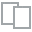
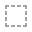
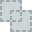
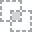
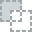
...
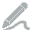
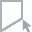
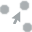
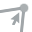
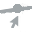

In [ ]:
plot_correlation(train)

  0%|          | 0/169 [00:00<?, ?it/s]


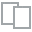
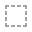
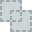
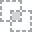
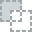
...
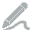
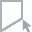
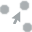
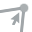
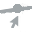

In [ ]:
plot_missing(train)



**Age and Credit History**: from above data anlysis one can see older individuals tend to have longer credit histories which states (strong positive correlation).

**Loan Grade and Interest Rate**: Higher loan grades are strongly associated with lower interest rates indicating how its association, indicating that loan risk is reflected in both metrics.

**Loan Amount and Income**: Larger loan amounts represent a higher percentage of the borrower's income, and higher-income individuals tend to borrow larger amounts trends in loan amounts.

**Loan Default**:
1. Certain criterea observed Higher loan grades and higher interest rates are both associated with a greater likelihood of loan default.
1. Borrowers who had a history of default tend to have worse loan grades.
1. Higherincome individuals and some with longer employment histories are less likely to have default on loans.
1. from plot one can see Higher percentages of income spent on loans increase the chances of default.
1. Loan Intent: There are negative correlations between loan intents like education and home improvement, meaning borrowers tend to focus on specific purposes for loans.

In summary, the data reveals that factors like age, income, loan grade, and interest rate are important predictors of loan behavior, including default risk.

In [91]:
import numpy as np
import pandas as pd

def generate_row(data, match_distribution=True):
    new_row = {}
    for col in data.columns:
        if data[col].dtype in ['float64', 'int64']:
            if match_distribution:
                # Trùng phân bố: Lấy mẫu từ phân phối chuẩn hóa của cột
                mean, std = data[col].mean(), data[col].std()
                new_row[col] = np.random.normal(mean, std)
            else:
                # Không trùng phân bố: Lấy giá trị ngoài phạm vi
                q1, q3 = np.percentile(data[col].dropna(), [25, 75])
                iqr = q3 - q1
                lower_bound = q1 - 1.5 * iqr
                upper_bound = q3 + 1.5 * iqr
                new_row[col] = np.random.choice(
                    [lower_bound - np.random.rand()*iqr, upper_bound + np.random.rand()*iqr]
                )
        elif data[col].dtype == 'object':
            if match_distribution:
                # Trùng phân bố: Lấy mẫu từ tần suất
                new_row[col] = np.random.choice(data[col].dropna().values)
            else:
                # Không trùng phân bố: Chọn nhãn ngẫu nhiên khác nhãn hiện có
                existing_values = set(data[col].dropna().values)
                new_row[col] = f"Anomaly_{np.random.randint(1000, 9999)}"  # Giá trị không tồn tại
        else:
            # Cột khác: Giữ nguyên giá trị phổ biến nhất (hoặc logic khác)
            new_row[col] = data[col].mode()[0]
    return pd.Series(new_row)

# Ví dụ sử dụng:
# Tạo dòng trùng phân bố
row_match = generate_row(train_new, match_distribution=True)
# Tạo dòng không trùng phân bố
row_not_match = generate_row(train_new, match_distribution=False)

row_match


,0
person_age,31.177469
person_income,108225.8625
person_home_ownership,MORTGAGE
person_emp_length,10.430474
loan_intent,MEDICAL
loan_grade,B
loan_amnt,1634.440912
loan_int_rate,9.778513
loan_percent_income,0.300992
cb_person_default_on_file,Y


In [90]:
train_new = pd.read_csv('./train.csv')
train_new = train_new.drop(columns=['id'])